In [1]:
#%matplotlib inline
import config.unetConfig as cfg
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import os
import random

import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.utils as vutils

from data import BraTSDataset
from gan.GANTrainer import GANTrainer
from gan.UNetGenerator import UNetGenerator
from gan.UNetDiscriminator import UNetDiscriminator
from IPython.display import HTML
from torch.utils.data import DataLoader
from utils import weights_init_norm, weights_init_ortho, plot_train_metrics

!jupyter nbextension enable --py widgetsnbextension

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK
Random Seed:  999


## Load the data

> **_NOTE:_**  CHANGE $\underline{BT\_CLASS}$ in the config file to one of $\textbf{["FLAIR", "SEG", "T1CE", "T1", "T2"]}$

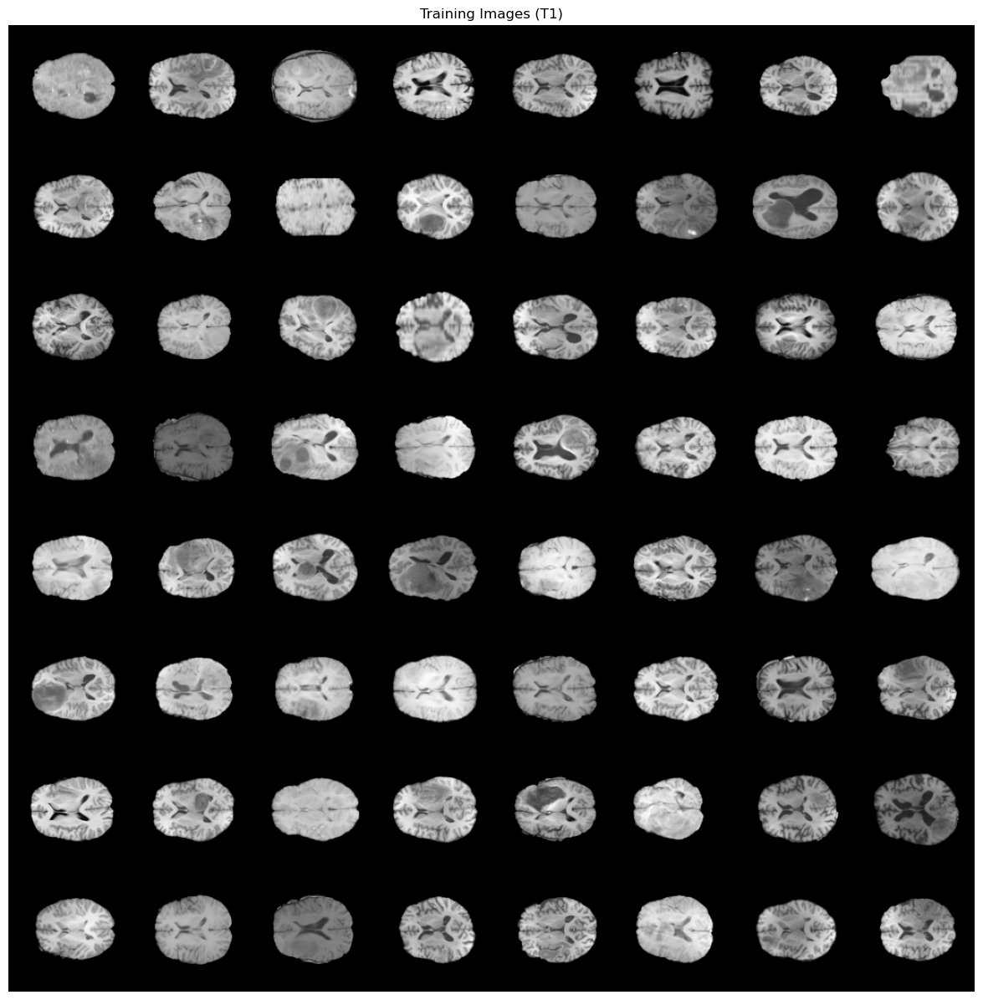

In [2]:
dpath = cfg.DSET_CPATHS[f"{cfg.BT_CLASS}"]

# load the T1 image filepaths in a sorted manner
image_paths = [os.path.join(dpath, impath) for impath in sorted(os.listdir(dpath))]

tf = transforms.Compose([
    transforms.Resize((cfg.INPUT_IMAGE_HEIGHT,cfg.INPUT_IMAGE_WIDTH)),
    transforms.CenterCrop((cfg.INPUT_IMAGE_HEIGHT,cfg.INPUT_IMAGE_WIDTH)),
    transforms.ToTensor(),
    ])

# Create the dataset
dataset = BraTSDataset(image_paths, tf)

# Create the dataloader
dataloader = DataLoader(dataset, batch_size=cfg.BATCH_SIZE,
                        shuffle=True, num_workers=cfg.NUM_WORKERS)

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(15,15))
plt.axis("off")
plt.title(f"Training Images ({cfg.BT_CLASS})")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(cfg.DEVICE), normalize=True).cpu(),(1,2,0)))

## Init Generator and weights

In [3]:
# Create the generator
netG = UNetGenerator(cfg.LATENT_SZ, cfg.NGF, cfg.NGC).to(cfg.DEVICE)

# Apply the weights_init_ortho
netG.apply(weights_init_norm)

# Print the model
print(netG)

UNetGenerator(
  (main): Sequential(
    (0): ConvTranspose2d(300, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01, inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01, inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01, inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.01, inplace=True)
    (1

## Init Discriminator and weights

In [4]:
# Create the Discriminator
netD = UNetDiscriminator(ns=cfg.NEG_SLOPE).to(cfg.DEVICE)

# Apply the weights_init_ortho
netD.apply(weights_init_ortho)

# Print the model
print(netD)

/home/y2k/csc2529-2022-project/src/utils.py:18: UserWarning: nn.init.orthogonal is now deprecated in favor of nn.init.orthogonal_.
  nn.init.orthogonal(m.weight.data)


UNetDiscriminator(
  (encoder): Encoder(
    (enc_blocks): ModuleList(
      (0): DBlock(
        (main): Sequential(
          (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
      (1): DBlock(
        (main): Sequential(
          (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
      (2): DBlock(
        (main): Sequential(
          (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
    )
    (downsample): AvgPool2d(kernel_size=2, stride=2, padding=0)
  )
  (decoder): Decoder(


## Train

In [5]:
trainer = GANTrainer(num_epochs=cfg.NUM_EPOCHS,
                        glr=cfg.GLR, dlr=cfg.DLR,
                        gbeta1=cfg.GBETA1, dbeta1=cfg.DBETA1,
                        dataloader=dataloader,
                        netG=netG, netD=netD,
                        device=cfg.DEVICE)

In [6]:
trainer.train(nz=cfg.LATENT_SZ, batch_sz=cfg.BATCH_SIZE)

Starting Training Loop...
[0/15][0/6]	Loss_D: 1.5074	Loss_G: 0.6674	D(x): 0.4370	D(G(z)): 0.4928 / 0.5131	MPSNR: 7.7502	MSSIM: 0.0041
[1/15][0/6]	Loss_D: 1.3884	Loss_G: 0.8353	D(x): 0.7454	D(G(z)): 0.6641 / 0.4340	MPSNR: 7.4910	MSSIM: 0.0032
[2/15][0/6]	Loss_D: 0.9797	Loss_G: 0.8341	D(x): 0.5104	D(G(z)): 0.2504 / 0.4389	MPSNR: 13.1653	MSSIM: 0.0586
[3/15][0/6]	Loss_D: 0.9233	Loss_G: 1.2676	D(x): 0.8651	D(G(z)): 0.4825 / 0.3498	MPSNR: 11.6569	MSSIM: 0.3253
[4/15][0/6]	Loss_D: 0.7739	Loss_G: 1.0831	D(x): 0.8438	D(G(z)): 0.4356 / 0.3495	MPSNR: 11.2397	MSSIM: 0.2243
[5/15][0/6]	Loss_D: 2.0057	Loss_G: 1.6768	D(x): 0.9884	D(G(z)): 0.7824 / 0.2063	MPSNR: 10.2292	MSSIM: 0.3191
[6/15][0/6]	Loss_D: 1.0073	Loss_G: 0.8375	D(x): 0.7295	D(G(z)): 0.4748 / 0.4552	MPSNR: 10.1309	MSSIM: 0.2504
[7/15][0/6]	Loss_D: 1.7208	Loss_G: 0.4050	D(x): 0.9793	D(G(z)): 0.7401 / 0.6907	MPSNR: 12.0301	MSSIM: 0.2638
[8/15][0/6]	Loss_D: 1.5271	Loss_G: 0.6050	D(x): 0.7423	D(G(z)): 0.6713 / 0.5527	MPSNR: 11.9218	MSSIM: 0.

## Plot Training Results

In [7]:
# Print and save max PSNR from training
print(f"Highest Training PSNR: {trainer.best_g_psnr} | Highest_Training_SSIM: {trainer.best_g_ssim}")
with open("output/training_mets.csv", 'a') as f:
    f.writelines(f"\nNUM_EPOCHS==>{cfg.NUM_EPOCHS}\t\
        BATCH_SIZE=={cfg.BATCH_SIZE}\t\
        LATENT_SIZE==>{cfg.LATENT_SZ}\t\
        GLR==>{cfg.GLR}\t\
        DLR==>{cfg.DLR}\t\
        BEST_PSNR==>{trainer.best_g_psnr:.4f}\t\
        BEST_SSIM: {trainer.best_g_ssim:.4f}")

Highest Training PSNR: 16.081775510204075 | Highest_Training_SSIM: 0.607316325513684


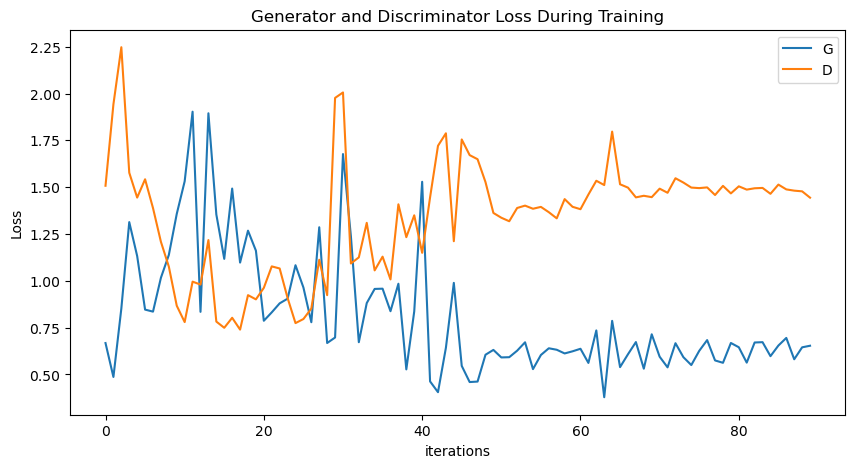

In [8]:
plot_train_metrics(trainer.G_losses, trainer.D_losses)

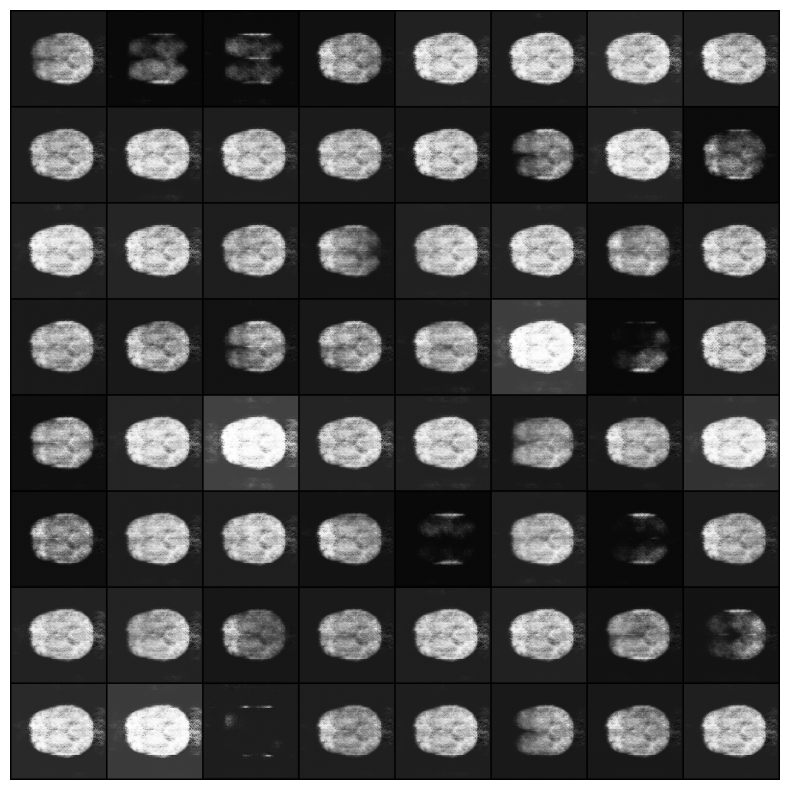

In [9]:
fig = plt.figure(figsize=(10,10))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in trainer.img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Save the Trained Model

In [10]:
param_str = f"_{cfg.NUM_EPOCHS}epochs_{cfg.BATCH_SIZE}batch_G_{cfg.LATENT_SZ}z_{cfg.NGF}feat_{cfg.GLR}lr_D_{cfg.NUM_LEVELS}lvl_{cfg.NDF}feat_{cfg.DLR}lr_{cfg.NEG_SLOPE}lRelu"

torch.save(trainer.best_d_state, f"models/unetgan/unetgan_{cfg.BT_CLASS}_Dstate_{param_str}.pth")
torch.save(trainer.best_g_state, f"models/unetgan/unetgan_{cfg.BT_CLASS}_Gstate_{param_str}.pth")

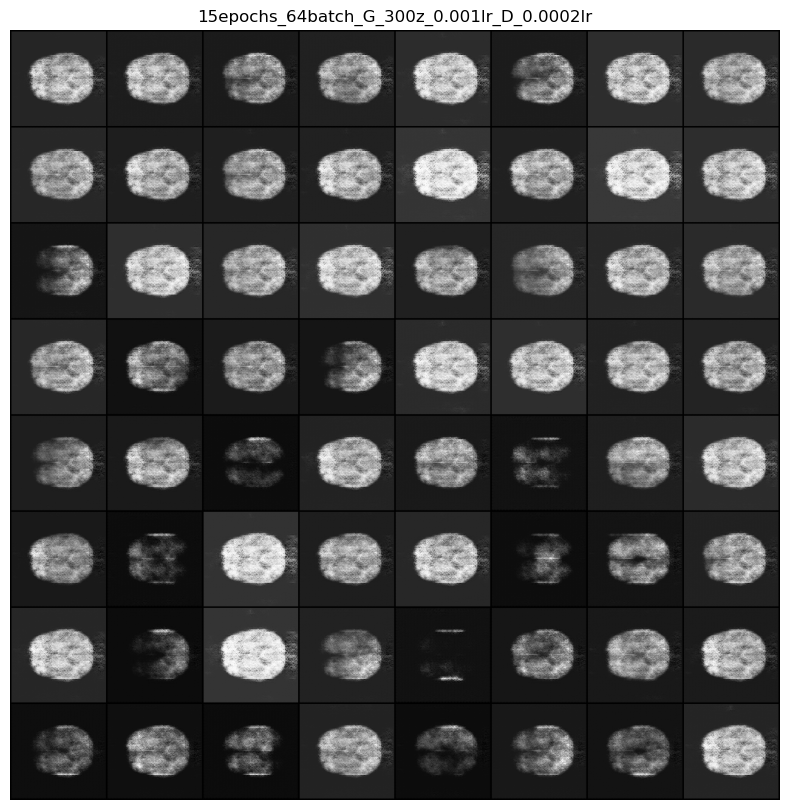

In [11]:
netGval = UNetGenerator(cfg.LATENT_SZ,cfg.NGF,cfg.NGC).to(cfg.DEVICE)
netGval.load_state_dict(torch.load(f"models/unetgan/unetgan_{cfg.BT_CLASS}_Gstate_{param_str}.pth"))
netGval.eval()

fixed_noise = torch.randn(cfg.BATCH_SIZE, cfg.LATENT_SZ, 1, 1, device=cfg.DEVICE)
with torch.no_grad():
    fake = netGval(fixed_noise).detach().cpu()

img = np.transpose(
        vutils.make_grid(fake, padding=2, scale_each=True, normalize=True),
        (1, 2, 0)
    ).cpu().numpy()
title_str = f"{cfg.NUM_EPOCHS}epochs_{cfg.BATCH_SIZE}batch_G_{cfg.LATENT_SZ}z_{cfg.GLR}lr_D_{cfg.DLR}lr"
plt.figure(figsize=(10,10))
plt.title(title_str)
plt.imshow(img)
plt.axis("off")
plt.imsave(f"output/training/unet_{cfg.BT_CLASS}_{title_str}.png",img)

### Save the images

In [12]:
with torch.no_grad():
    fixed_noise = torch.randn(369, cfg.LATENT_SZ, 1, 1, device=cfg.DEVICE)

fake = netGval(fixed_noise).detach().cpu()

for i in range(fake.size(0)):
           vutils.save_image(fake[i, :, :, :], f'output/unetgan/{cfg.BT_CLASS.lower()}/{i}.png')